# Product Recognition on Store Shelves

**Exam Project:** Developed for the final exam by **Massimo Modesti** and **Federico Tampieri** as part of the course.  
This notebook implements a system for recognizing cereal box products on supermarket shelves, following the exam requirements.

---

## 1. Step C – Whole-Shelf Detection Challenge

In this step we address the **“whole shelf” detection problem**: given a complete supermarket shelf image containing many cereal boxes, the goal is to detect as many product instances as possible with **no mistakes**.

We are provided with:
- **Scene images**: `h1.png, h2.png, h3.png, h4.png, h5.png`, each showing a full cereal shelf.
- **Product templates**: `0.jpg` to `23.jpg`, corresponding to the individual cereal box models.

These images are particularly challenging because:
- each shelf contains **more than 40 product instances**,
- there are **distractor elements** (price tags, labels, shelf edges, background clutter),
- the overall image resolution is relatively **low**, making small details harder to detect.

In this notebook we focus on:
- designing a detection pipeline tailored to this scenario,
- maximizing the **number of correctly detected cereal boxes**,
- while keeping **false positives as close to zero as possible**.

The following sections describe the dataset preparation, the training strategy, and the evaluation of the detector on the five whole-shelf images.

## 2. Possible Approaches Considered

To solve the whole-shelf detection problem, several different strategies were initially taken into consideration.  
The challenge is difficult because each image contains many cereal boxes, different shapes and colors, and several distracting elements such as price tags or shelf details.

The main possible approaches we evaluated were:

1. **Using the product images directly for matching**  
   Trying to detect each cereal box by comparing the scene with the reference images (0.jpg–23.jpg).

2. **Manually designing a detection procedure**  
   For example by using image-processing techniques, color information, or local features to identify each product.

3. **Using an automatic detection model**  
   A model that learns to recognize the cereal boxes starting from a set of labeled examples.

After evaluating these options, we decided to use an automated detection model (**YOLOv5**), because it allowed us to handle:
- many objects per image,
- partial occlusions,
- low-resolution details,
- and the presence of distractors.

This approach also scales better when the number of products increases or the scenes become more complex.

## 3. Model Selection: YOLOv5

We selected **YOLOv5** for several practical reasons:

- it offers clear and extensive documentation;
- many examples and tutorials are available online;
- the PyTorch implementation is easy to work with;
- it provides an excellent balance between **speed** and **accuracy**;
- training and inference are straightforward thanks to the ready-to-use `train.py` and `detect.py` scripts.

In addition, choosing YOLOv5 allowed us to perform a **complete training process** of an object detection model, rather than relying only on pretrained templates or manual matching techniques.

## 4. Main Challenge: The Dataset

To train YOLOv5 effectively, a dataset must be:

- sufficiently **large**;
- **diverse**, covering many possible visual variations;
- as **close as possible to real conditions**, including shelf structure, lighting, perspective, noise, and background clutter.

Since no real dataset of adequate size was available for this task, we decided to **generate a synthetic dataset**.  
The following sections describe how it was created and how it was used for training.

## 5. Synthetic Dataset Generation

### 5.1 General Idea

We developed a **Python script** that automatically generates synthetic training images starting from:

- **product cutouts** (images of the cereal boxes with transparent background),
- **real supermarket shelf images** used as backgrounds.

The script creates new images in which:

- products are **randomly placed** on the shelves;
- **geometric transformations** are applied (rotation, scaling, mild perspective changes);
- **photometric variations** are introduced (illumination changes, blur, noise, compression artifacts);
- the **number of products per image is variable**, to avoid repetitive or easily memorisable patterns.

For each generated image, the script also saves a **YOLO annotation file** describing all bounding boxes in normalized format.

### 5.2 Code Created for Synthetic Image Generation

The first versions of the synthetic dataset turned out to be ineffective: although the model performed well on the artificial validation set, its performance dropped significantly when tested on real shelf images.  
The main issue was that the initial synthetic images were too clean, too regular, and lacked many of the “imperfections” that naturally occur in real-world scenes.

In particular, the early datasets were missing several crucial factors, such as:
- variations in lighting and shadows,
- motion blur or out-of-focus areas,
- image noise (sensor noise, JPEG compression artifacts),
- mild perspective distortions,
- partial occlusions between products,
- realistic but limited overlap between objects,
- differences in color, saturation, and exposure,
- small imperfections in cutouts or backgrounds,
- the presence of distractors (price tags, labels, shelf edges, clutter).

In those early versions, the products appeared too similar, too perfectly centered, too sharply defined, and uniformly illuminated.  
As a result, the model learned an “idealized” scenario that does not exist in real supermarket images.  
This produced the typical synthetic-to-real gap: **very high accuracy on synthetic images, but poor performance on real shelves**.

To address this, we significantly increased both the volume and the complexity of the dataset:
- generating up to **30,000 images**,  
- placing **40–60 products** per image,  
- ensuring at least **35,000 occurrences per class**,  
- and adding rotations, noise, blur, color variations, perspective distortions, occlusions, and irregular placement.

Only after introducing this variety of imperfections—those naturally found in real photographs—did the model start to generalize correctly.  
The key insight is that the goal of a synthetic dataset is **not** to create perfect images, but to replicate the imperfections of real-world scenarios.  
This richer variability is what eventually allowed YOLOv5 to perform well even on real supermarket shelves, despite the challenging conditions.


In [1]:
#!/usr/bin/env python3
"""
Synthetic Dataset Generator for YOLOv5

This script creates a synthetic dataset by compositing product images (JPG/PNG) onto real shelf backgrounds.
It ensures each class appears at least a fixed number of times and prevents excessive overlap between instances.
Augmentations include color jitter, blur/noise, perspective warp, edge-cut occlusion and random erasing to improve robustness.
"""
import os
import cv2
import numpy as np
import random

# ------------------------
# Configuration
# ------------------------
BACKGROUNDS_DIR     = "dataset/backgrounds"   # background images (e.g. 1.jpg–25.jpg)
MODELS_DIR          = "models"                # product cutouts (0.jpg,…,23.jpg) with alpha channel
OUTPUT_IMAGES_DIR   = "dataset/images/train"  # folder where synthetic images will be saved
OUTPUT_LABELS_DIR   = "dataset/labels/train"  # folder where YOLO label files will be saved
# NUM_IMAGES          = 30000                   # minimum number of synthetic images to generate
# MIN_OBJS, MAX_OBJS  = 40, 60                  # min/max number of objects per image
# MIN_OCC_PER_CLASS   = 35000                   # minimum total occurrences per class in the whole dataset
NUM_IMAGES          = 5
MIN_OBJS, MAX_OBJS  = 40, 60
MIN_OCC_PER_CLASS   = 1
MAX_IOU             = 0.15                    # maximum allowed IoU between objects (to avoid excessive overlap)
MIN_FACTOR, MAX_FACTOR = 4.5, 6.0             # object height = bg_height / factor (controls relative object size)
# ------------------------


def ensure_dir(path):
    """Create directory if it does not exist."""
    if not os.path.exists(path):
        os.makedirs(path)


def compute_iou(box1, box2):
    """
    Compute Intersection over Union (IoU) between two bounding boxes.

    Boxes are given as (x1, y1, x2, y2) in absolute pixel coordinates.
    """
    x1, y1, x2, y2 = box1
    xx1, yy1, xx2, yy2 = box2

    # Intersection coordinates
    ix1, iy1 = max(x1, xx1), max(y1, yy1)
    ix2, iy2 = min(x2, xx2), min(y2, yy2)

    # Intersection width/height
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    inter = iw * ih

    # Individual box areas
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (xx2 - xx1) * (yy2 - yy1)
    union = area1 + area2 - inter

    return inter / union if union > 0 else 0.0


def load_models(models_dir):
    """
    Load product models from `models_dir`.

    Expected file format:
    - Filenames begin with an integer class ID, e.g. "0.png", "3_variant.png", etc.
    - Images can be JPG or PNG.
    - If an image has only 3 channels (BGR), an opaque alpha channel is added.
    - Only images with 4 channels (BGRA) are kept.

    Returns:
        dict: class_id -> RGBA image (numpy array).
    """
    models = {}
    for fname in os.listdir(models_dir):
        if not fname.lower().endswith(('.jpg', '.png')):
            continue

        # Extract class ID from filename (everything before first underscore)
        base = os.path.splitext(fname)[0].split('_')[0]
        try:
            cls = int(base)
        except ValueError:
            # Skip files that do not start with a valid integer class ID
            continue

        img_path = os.path.join(models_dir, fname)
        img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        if img is None:
            continue

        # Ensure there is an alpha channel (BGRA)
        if img.ndim == 3 and img.shape[2] == 3:
            # Add a full opaque alpha channel
            b, g, r = cv2.split(img)
            alpha = np.full_like(b, 255)
            img = cv2.merge((b, g, r, alpha))
        elif not (img.ndim == 3 and img.shape[2] == 4):
            # Skip images that are not 3- or 4-channel
            continue

        models[cls] = img

    if not models:
        raise RuntimeError(f"No model images found in {models_dir}")
    return models


def overlay_image(bg, fg, x, y):
    """
    Alpha-blend RGBA foreground `fg` onto BGR background `bg` at position (x, y).

    Args:
        bg (np.ndarray): background image (H x W x 3)
        fg (np.ndarray): foreground image (h x w x 4) with alpha channel
        x (int): top-left x-coordinate on background
        y (int): top-left y-coordinate on background

    Returns:
        tuple: (x1, y1, x2, y2) final bounding box coordinates of the placed foreground.
    """
    h_fg, w_fg = fg.shape[:2]
    h_bg, w_bg = bg.shape[:2]

    # Clip to background boundaries
    x1, y1 = max(0, x), max(0, y)
    x2, y2 = min(w_bg, x + w_fg), min(h_bg, y + h_fg)

    # Corresponding region on the foreground
    fx1, fy1 = x1 - x, y1 - y
    fx2, fy2 = fx1 + (x2 - x1), fy1 + (y2 - y1)

    # Extract alpha and RGB from foreground
    alpha = fg[fy1:fy2, fx1:fx2, 3:] / 255.0
    fg_rgb = fg[fy1:fy2, fx1:fx2, :3]

    # Region of interest on background
    roi = bg[y1:y2, x1:x2]

    # Alpha blending
    bg[y1:y2, x1:x2] = (alpha * fg_rgb + (1 - alpha) * roi).astype(np.uint8)

    return x1, y1, x2, y2


def rotate_full(fg, angle):
    """
    Rotate an RGBA image `fg` by `angle` degrees, expanding the canvas so that
    the entire rotated object fits without cropping.
    """
    h, w = fg.shape[:2]
    theta = np.deg2rad(angle)
    cos_t, sin_t = abs(np.cos(theta)), abs(np.sin(theta))

    # New bounding dimensions after rotation
    new_w = int(w * cos_t + h * sin_t)
    new_h = int(w * sin_t + h * cos_t)

    # Rotation matrix around the original center
    M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0)
    # Adjust translation to re-center on the new canvas
    M[0, 2] += (new_w - w) / 2
    M[1, 2] += (new_h - h) / 2

    return cv2.warpAffine(
        fg,
        M,
        (new_w, new_h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0, 0),
    )


def random_perspective(img, max_warp=0.2):
    """
    Apply a random perspective transformation to `img`.

    The four corners of the image are randomly displaced by up to `max_warp`
    times the width/height, then a homography is computed.

    Args:
        img (np.ndarray): input RGBA image
        max_warp (float): maximum relative displacement of corners

    Returns:
        np.ndarray: perspective-warped RGBA image.
    """
    h, w = img.shape[:2]

    def pts(delta):
        return [
            (random.uniform(-delta, delta) * w, random.uniform(-delta, delta) * h),
            (w + random.uniform(-delta, delta) * w, random.uniform(-delta, delta) * h),
            (w + random.uniform(-delta, delta) * w, h + random.uniform(-delta, delta) * h),
            (random.uniform(-delta, delta) * w, h + random.uniform(-delta, delta) * h),
        ]

    src = np.float32([(0, 0), (w, 0), (w, h), (0, h)])
    dst = np.float32(pts(max_warp))
    M = cv2.getPerspectiveTransform(src, dst)

    return cv2.warpPerspective(
        img,
        M,
        (w, h),
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0, 0),
    )


def main():
    """Main entry point: generate synthetic images and YOLO labels."""
    # Ensure output directories exist
    ensure_dir(OUTPUT_IMAGES_DIR)
    ensure_dir(OUTPUT_LABELS_DIR)

    # Collect all background files
    bg_files = [
        f for f in os.listdir(BACKGROUNDS_DIR)
        if f.lower().endswith(('.jpg', '.png'))
    ]
    if not bg_files:
        raise RuntimeError(f"No background images in {BACKGROUNDS_DIR}")

    # Load product models (class_id -> RGBA image)
    models = load_models(MODELS_DIR)

    # Track how many times each class has been placed
    counts = {cls: 0 for cls in models.keys()}

    idx = 0
    # Continue until:
    #   - at least NUM_IMAGES images generated, AND
    #   - each class has at least MIN_OCC_PER_CLASS occurrences
    while idx < NUM_IMAGES or any(counts[c] < MIN_OCC_PER_CLASS for c in counts):
        # Randomly select a background image
        bg_path = os.path.join(BACKGROUNDS_DIR, random.choice(bg_files))
        bg = cv2.imread(bg_path)
        if bg is None:
            continue

        h_bg, w_bg = bg.shape[:2]
        labels, bboxes = [], []

        # Random number of objects for this image
        num_objs = random.randint(MIN_OBJS, MAX_OBJS)

        for _ in range(num_objs):
            # Randomly sample a model (class_id and RGBA image)
            cls, fg_orig = random.choice(list(models.items()))
            fh, fw = fg_orig.shape[:2]

            # --- Scaling: control size relative to background height ---
            factor = random.uniform(MIN_FACTOR, MAX_FACTOR)
            target_h = int(h_bg / factor)
            scale = target_h / float(fh)
            fg = cv2.resize(
                fg_orig,
                (int(fw * scale), target_h),
                interpolation=cv2.INTER_AREA
            )

            # --- Split RGB and alpha channels ---
            bgr = fg[..., :3]
            alpha_ch = fg[..., 3:]

            # --- Color jitter: brightness/contrast + saturation ---
            a = random.uniform(0.8, 1.2)       # contrast
            b = random.uniform(-30, 30)        # brightness
            bgr = cv2.convertScaleAbs(bgr, alpha=a, beta=b)

            # HSV-based saturation change
            hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV).astype(np.float32)
            hsv[..., 1] *= random.uniform(0.7, 1.3)
            hsv[..., 1] = np.clip(hsv[..., 1], 0, 255)
            bgr = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

            # Merge back RGB and alpha
            fg = np.dstack((bgr, alpha_ch))

            # --- Rotation ---
            fg = rotate_full(fg, random.uniform(-20, 20))

            # --- Edge-cut occlusion (simulate partial occlusions) ---
            if random.random() < 0.5:
                h_fg, w_fg = fg.shape[:2]
                side = random.choice([0, 1, 2, 3])  # 0=top,1=right,2=bottom,3=left
                depth = int(
                    (h_fg if side in [0, 2] else w_fg) * random.uniform(0.05, 0.70)
                )
                if side == 0:       # cut from top
                    fg[:depth, :, 3] = 0
                elif side == 2:     # cut from bottom
                    fg[-depth:, :, 3] = 0
                elif side == 1:     # cut from right
                    fg[:, -depth:, 3] = 0
                else:               # cut from left
                    fg[:, :depth, 3] = 0

            # --- Blur (simulated defocus/motion blur) ---
            if random.random() < 0.3:
                k = random.choice([3, 5])
                bgr = cv2.GaussianBlur(fg[..., :3], (k, k), 0)
                fg = np.dstack((bgr, fg[..., 3:]))

            # --- Additive Gaussian noise ---
            if random.random() < 0.2:
                noise = np.random.normal(0, 10, fg[..., :3].shape).astype(np.int16)
                bgr = np.clip(
                    fg[..., :3].astype(np.int16) + noise,
                    0,
                    255
                ).astype(np.uint8)
                fg = np.dstack((bgr, fg[..., 3:]))

            # --- Perspective warp (viewpoint changes) ---
            if random.random() < 0.3:
                fg = random_perspective(fg)

            h_fg, w_fg = fg.shape[:2]

            # Try up to 10 random positions to find one with low IoU
            for _ in range(10):
                x = random.randint(0, max(0, w_bg - w_fg))
                y = random.randint(0, max(0, h_bg - h_fg))

                # Candidate bounding box in absolute coordinates
                box = (x, y, x + w_fg, y + y + h_fg)

                # Check IoU against already placed objects
                if all(compute_iou(box, bb) < MAX_IOU for bb in bboxes):
                    # Place object and update counts/labels
                    x1, y1, x2, y2 = overlay_image(bg, fg, x, y)
                    bboxes.append((x1, y1, x2, y2))
                    counts[cls] += 1

                    # Convert to YOLO normalized format
                    cx = ((x1 + x2) / 2) / w_bg
                    cy = ((y1 + y2) / 2) / h_bg
                    bw = (x2 - x1) / w_bg
                    bh = (y2 - y1) / h_bg

                    labels.append(f"{cls} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}")
                    break

        # Image base name (shared between image and label)
        name = f"synthetic_{idx:05d}"

        # Force height = 640 px for all images (keep aspect ratio)
        h_bg, w_bg = bg.shape[:2]
        new_h = 640
        new_w = int(w_bg * new_h / h_bg)
        bg = cv2.resize(bg, (new_w, new_h), interpolation=cv2.INTER_AREA)

        # Save image and corresponding YOLO label file
        cv2.imwrite(os.path.join(OUTPUT_IMAGES_DIR, f"{name}.jpg"), bg)
        with open(os.path.join(OUTPUT_LABELS_DIR, f"{name}.txt"), 'w') as f:
            f.write("\n".join(labels))

        idx += 1

        # Periodic progress report
        if idx % 50 == 0:
            print(f"Generated {idx}/{NUM_IMAGES}, min count={min(counts.values())}")

    print("Dataset generation complete.")
    print("Final counts per class:", counts)


if __name__ == '__main__':
    main()

Dataset generation complete.
Final counts per class: {0: 10, 1: 13, 10: 5, 11: 6, 12: 5, 13: 8, 14: 12, 15: 10, 16: 13, 17: 4, 18: 5, 19: 14, 2: 2, 20: 7, 21: 4, 22: 13, 23: 8, 24: 9, 25: 10, 26: 7, 3: 11, 4: 12, 5: 7, 6: 10, 7: 11, 8: 12, 9: 11}


### Example of Background Images

Below are some examples of real supermarket shelf images downloaded from the internet.  
These backgrounds are used as base scenes for generating the synthetic dataset.  
They provide realistic shelf textures, lighting conditions, and product placement environments.

The synthetic images generated by the script place multiple product cutouts onto these backgrounds,
together with random augmentations (color jitter, blur, perspective warp, occlusions).

**Sample supermarket shelf backgrounds:**

In [2]:
from IPython.display import HTML, display
import os

folder = "dataset/backgrounds"

files = [
    f for f in os.listdir(folder)
    if f.lower().endswith((".jpg"))
][1:5]

images_html = ""
for f in files:
    images_html += f"<img src='{folder}/{f}' style='width:300px; margin:5px; display:inline-block;'>"

display(HTML(images_html))

### Example of Synthetic Images

Here we show some examples of the synthetic images generated by our pipeline.  
Each image is created by placing multiple product cutouts onto real shelf backgrounds,  
together with random augmentations (color, rotation, blur, occlusions, perspective).

**Sample synthetic images:**

In [3]:
from IPython.display import HTML, display, Image
import os

folder = "dataset/images/train"

files = [
    f for f in os.listdir(folder)
    if f.lower().endswith((".jpg"))
][1:5]

images_html = ""
for f in files:
    images_html += f"<img src='{folder}/{f}' style='width:300px; margin:5px; display:inline-block;'>"

display(HTML(images_html))

For each generated image, a `.txt` file with the same name is created.  
This file contains the object annotations in the standard YOLO format.  
Each line corresponds to one object and includes:

- **class_id**  
- **cx, cy** – coordinates of the bounding box center  
- **w, h** – bounding box width and height  

All coordinates are **normalized** to the \([0, 1]\) range with respect to the image size.

Below is an example: for the image shown, the corresponding YOLO label file is displayed.

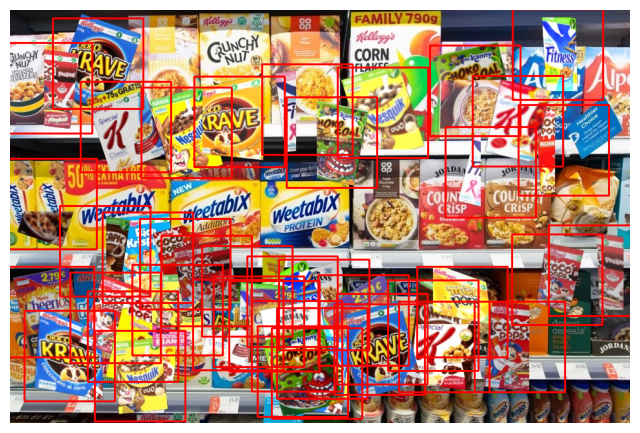

Label file content:
8 0.893229 0.340625 0.094792 0.209375
21 0.222396 0.600781 0.096875 0.217188
6 0.601562 0.250781 0.134375 0.245312
16 0.600521 0.796875 0.086458 0.184375
3 0.750521 0.197656 0.136458 0.239063
4 0.066667 0.471094 0.110417 0.207813
19 0.506771 0.714063 0.119792 0.212500
14 0.682292 0.764844 0.091667 0.220312
15 0.383333 0.682031 0.122917 0.220312
14 0.153125 0.584375 0.081250 0.178125
1 0.141667 0.132031 0.139583 0.239063
22 0.063021 0.732031 0.115625 0.220312
5 0.284896 0.298438 0.117708 0.221875
6 0.503125 0.832031 0.100000 0.210938
16 0.729688 0.731250 0.094792 0.218750
1 0.096354 0.837500 0.130208 0.234375
25 0.821875 0.817187 0.116667 0.221875
20 0.818750 0.271094 0.106250 0.201563
9 0.186979 0.284375 0.128125 0.221875
25 0.170833 0.745313 0.118750 0.206250
13 0.883854 0.109375 0.080208 0.178125
8 0.282813 0.615625 0.105208 0.206250
15 0.198958 0.790625 0.135417 0.228125
13 0.455729 0.706250 0.128125 0.243750
10 0.700521 0.816406 0.111458 0.207813
6 0.209375 0.88

In [4]:
import cv2
import matplotlib.pyplot as plt

# --- Image and label names ---
img_name = "synthetic_00001.jpg"
label_name = img_name.replace(".jpg", ".txt")

# --- Load image (OpenCV loads as BGR, convert to RGB) ---
img_path = f"dataset/images/train/{img_name}"
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w, _ = img.shape

# --- Load YOLO labels ---
with open(f"dataset/labels/train/{label_name}", "r") as f:
    lines = f.readlines()

# --- Draw square markers at bounding-box centers ---
for line in lines:
    cls, cx, cy, bw, bh = map(float, line.split())

    # Convert normalized coords to pixels
    x_center = int(cx * w)
    y_center = int(cy * h)

    # Marker size (half side)
    s = 70  

    # Draw red square around center
    cv2.rectangle(
        img,
        (x_center - s, y_center - s),
        (x_center + s, y_center + s),
        (255, 0, 0),   # RGB red
        thickness=2
    )

# --- Show final annotated image ---
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.axis("off")
plt.show()

# --- Print YOLO label file ---
print("Label file content:")
print(open(f"dataset/labels/train/{label_name}").read())


## 6. YOLOv5 Setup

### 6.1 Dataset Setup for Training
The final synthetic dataset consists of approximately **30,000 images**, divided into:

- **25,000** images for training  
- **5,000** images for validation  

This size represents a balance between ensuring a sufficiently large number of training examples and respecting the computational limits of the available hardware.

### Dataset Structure (YOLOv5 Format)

The dataset follows the standard YOLOv5 directory layout:

```text
dataset/
├─ images/
│  ├─ train/
│  └─ val/
└─ labels/
   ├─ train/
   └─ val/


### 6.2 YOLOv5 Installation and Setup

To use YOLOv5, it is sufficient to clone the official repository and install the required dependencies.  
These steps need to be executed only once:

```bash
git clone https://github.com/ultralytics/yolov5.git
cd yolov5
pip install -r requirements.txt


### 6.3 Training the Model

The model was trained using the official `train.py` script from YOLOv5.  
Below is the command used for the final experiment:

```bash
python train.py
  --imgsz 640
  --batch-size 16
  --epochs 50
  --patience 10
  --data data/products.yaml
  --weights yolov5s.pt
  --project ../runs \
  --name stepC_augmented
  --cache ram
  --device 0
  --hyp hyp.yaml


The main arguments have the following meaning:

- **`--imgsz 640`** sets the input resolution used during training.
- **`--batch-size 16`** defines how many images are processed at the same time (chosen according to GPU memory).
- **`--epochs 50`** specifies the maximum number of training epochs.
- **`--patience 10`** activates early stopping if the validation metrics stop improving.
- **`--data data/products.yaml`** provides the dataset configuration file, which includes paths and class definitions.
- **`--weights yolov5s.pt`** loads the pretrained YOLOv5-small weights as initialization.
- **`--project ../runs`** sets the output directory where training results and logs will be saved.
- **`--name stepC_augmented`** assigns a name to the experiment (e.g., creating `runs/stepC_augmented/`).
- **`--cache ram`** caches images and labels in RAM to speed up training.
- **`--device 0`** selects GPU number 0 for training.
- **`--hyp hyp.yaml`** loads a custom set of hyperparameters.

## 7. Training Results
The YOLOv5 model was trained on the synthetic dataset for a maximum of 50 epochs, with early stopping enabled.  
The final results show that the model converged quickly and achieved extremely high performance on the **5,000 validation images** belonging to the synthetic dataset.


### 7.1 Global Performance Metrics

On the validation set (5,000 images, ~200,000 total annotated instances), the model achieved:

- **Precision:** 0.999  
- **Recall:** 0.997  
- **mAP@50:** 0.995  
- **mAP@50–95:** 0.925  

These values indicate that the detector is capable of identifying almost every object (very high recall) while producing almost no false detections (very high precision).

### 7.2 Per-Class Metrics

All classes show extremely consistent performance:

- **mAP@50:** ≈ 0.995 for every class  
- **mAP@50–95:** typically between **0.91 and 0.93**  
- **Precision / Recall:** often ≥ 0.998  

This confirms that the dataset was sufficiently large and balanced to allow uniform learning across all cereal box categories.

### 7.3 Interpretation

The model exhibits near-perfect performance on the synthetic validation set, meaning that:

- the network successfully learned the distinctive appearance of each cereal box,  
- the synthetic dataset included enough variability (transformations, noise, occlusions, lighting changes),  
- class balancing prevented the long-tail problem,  
- augmentations reduced the risk of overfitting to artificially clean or repetitive patterns.

### 7.4 Visual Analysis of Training Metrics
During training, YOLOv5 automatically produces a series of diagnostic plots that help evaluate the behaviour of the model.
Below is a summary and interpretation of the most relevant charts.

#### 7.4.1 Confusion Matrix

The confusion matrix shows nearly perfect diagonal dominance: each class is correctly recognized with ≈ 99% accuracy and almost no confusion between different cereal boxes.
This is expected given the size and diversity of the synthetic dataset and confirms that the model learned to distinguish all categories reliably

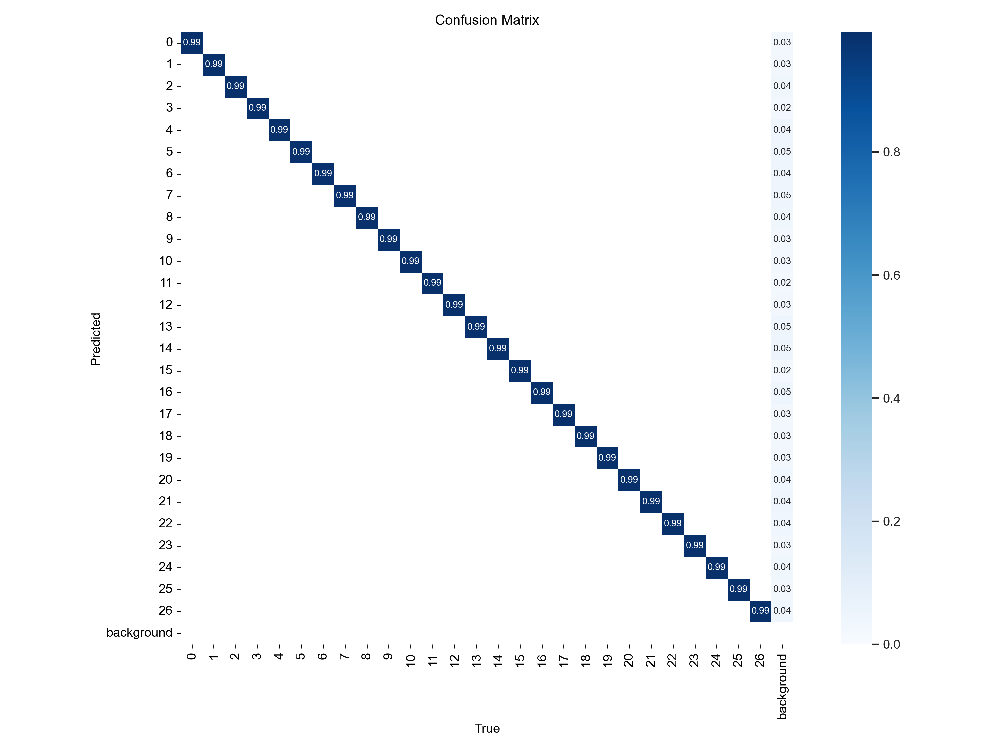

In [5]:
display(Image(filename="runs/stepC_augmented/confusion_matrix.png", width=600, height=600))

#### **7.4.2 F1-Confidence Curve**

The F1 score remains extremely high (close to **1.0**) across all confidence thresholds.  
This indicates:

- **High precision** (few false positives)  
- **High recall** (few false negatives)

The optimal operating confidence value is around **0.60**, where the F1 score reaches its maximum.


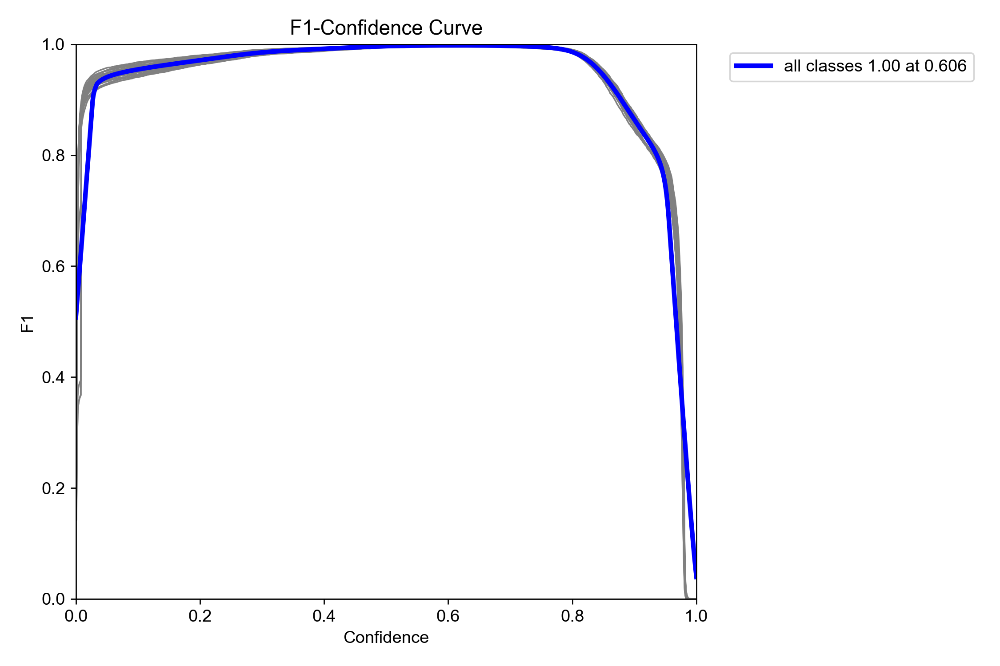

In [6]:
display(Image(filename="runs/stepC_augmented/F1_curve.png", width=600, height=600))

#### **7.4.3 Precision-Confidence Curve**

Precision approaches **1.0** for confidence values above approximately **0.30**.  
This indicates that when the model assigns a sufficiently high confidence to a prediction, it is **almost always correct**.
The upward trend of the curve confirms the effectiveness of the large synthetic dataset in reducing **false positives**, ensuring that the model remains highly selective and reliable when identifying objects.

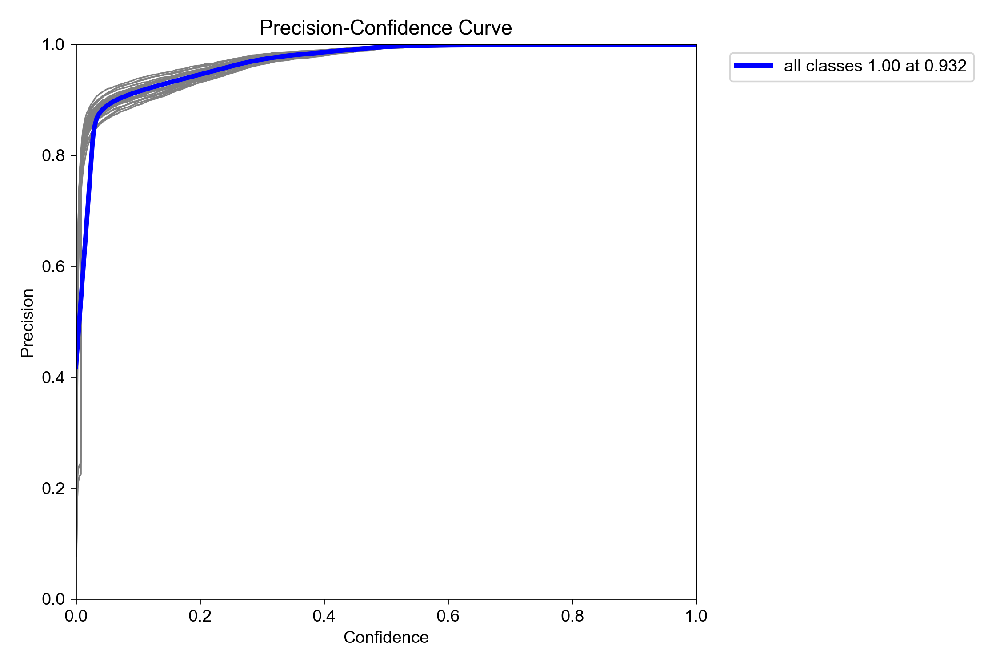

In [7]:
display(Image(filename="runs/stepC_augmented/P_curve.png", width=600, height=600))

#### **7.4.4 Recall-Confidence Curve**

Recall remains close to **1.0** across a wide range of confidence thresholds.  
This indicates that the model successfully detects **almost all objects** present in the validation images.

Such consistently high recall is a direct consequence of:
- the **large number of objects per image** (40–60), which provides dense supervision during training  
- the **high variability** introduced by the synthetic dataset, which improves the model’s ability to generalize and reduces missed detections


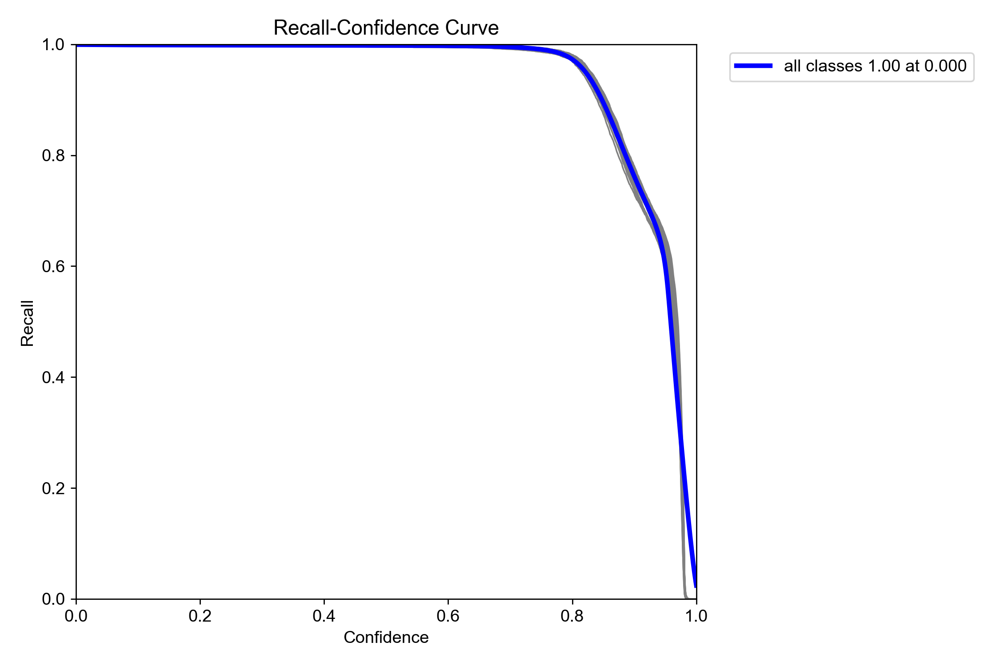

In [8]:
display(Image(filename="runs/stepC_augmented/R_curve.png", width=600, height=600))

#### **7.4.5 Precision–Recall Curve**

The Precision–Recall curve is nearly a **perfect square**, indicating consistently high precision even as recall increases.  
The model achieves:

- **AP@50 ≈ 0.995**

This exceptionally high value confirms that the detector performs extremely well within the synthetic domain, maintaining both high precision and high recall across the entire operating range.

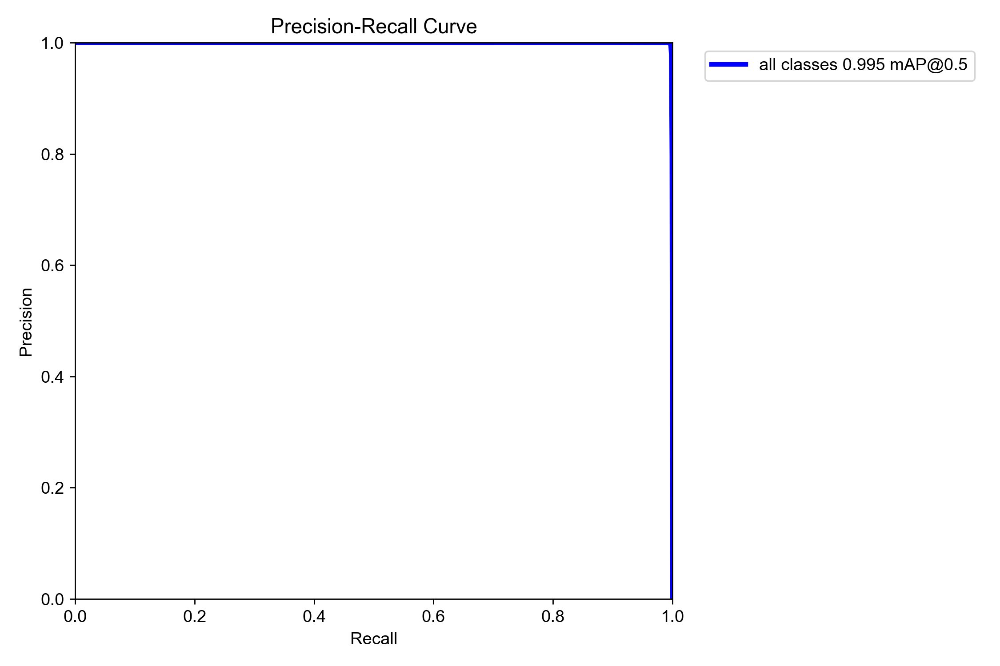

In [9]:
display(Image(filename="runs/stepC_augmented/PR_curve.png", width=600, height=600))

#### **7.4.6 Label Distribution and Correlogram**

These plots illustrate the distribution of bounding-box parameters:

- **x, y** → object center positions  
- **width, height** → box dimensions  

#### **Key Observations**

- **Uniform spatial distribution:**  
  Object centers are spread uniformly across the image, a direct result of the random placement strategy used during dataset generation.

- **Realistic box dimensions:**  
  Width and height follow plausible distributions governed by the scaling range (`MIN_FACTOR`, `MAX_FACTOR`), ensuring varied yet realistic object sizes.

- **No class imbalance:**  
  Each class appears **~30,000 times**, guaranteeing balanced training and preventing the model from being biased toward specific classes.

These results confirm that the synthetic dataset was **statistically well-structured**, providing strong and diverse supervision that supports robust YOLOv5 training.


In [10]:
from IPython.display import HTML

HTML("""
<div style="display: flex; justify-content: flex-start; gap: 20px;">
    <img src="runs/stepC_augmented/labels.jpg" width="500"/>
    <img src="runs/stepC_augmented/labels_correlogram.jpg" width="500"/>
</div>
""")


#### **7.4.7 Results**
The plot shows that the model converges rapidly and stably across all metrics.
- **Training losses** (box, obj, cls) decrease smoothly, indicating consistent learning.
- **Validation losses** remain extremely low and almost flat, confirming excellent generalization within the synthetic domain and the absence of overfitting.
- **Precision and Recall** quickly reach ~1.0, meaning the model makes almost no false positives and detects nearly all objects.
- **mAP@0.5 ≈ 0.995** and **mAP@0.5:0.95 ≈ 0.92–0.93**, demonstrating outstanding detection performance.

**In summary:**  
The curves confirm fast convergence, no overfitting, a well-structured synthetic dataset, and excellent performance across all classes — the model is fully optimized for the synthetic domain and ready for evaluation on real images.


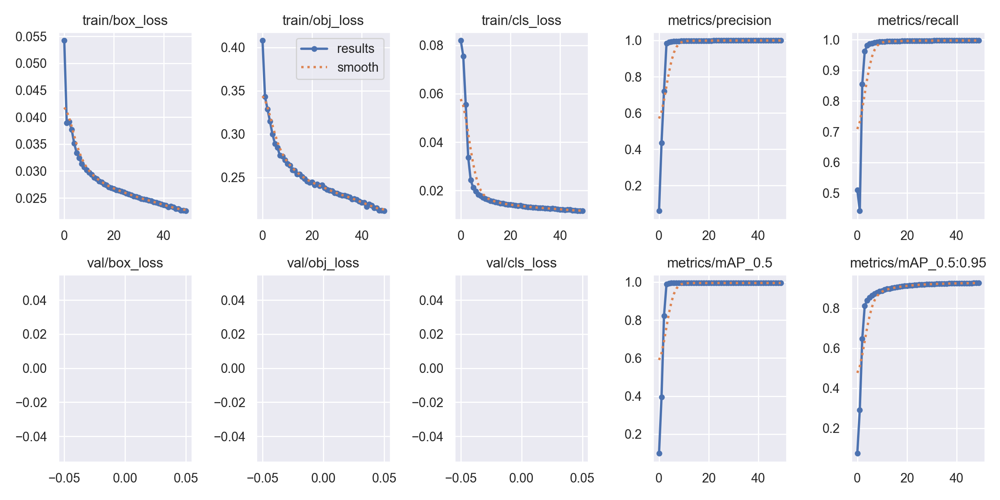

In [11]:
display(Image(filename="runs/stepC_augmented/results.png", width=600, height=600))

#### **7.4.8 Training Batches**

In [12]:
from IPython.display import HTML, display

folder = "runs/stepC_augmented"

# 🔥 QUI metti i nomi ESATTI dei file che vuoi mostrare
files = [
    "train_batch0.jpg",
    "train_batch1.jpg",
    "train_batch2.jpg"
]

images_html = "<div style='display:flex; gap:10px;'>"

for f in files:
    images_html += f"<img src='{folder}/{f}' style='width:300px; margin:5px; display:inline-block;'>"

images_html += "</div>"

display(HTML(images_html))


#### **7.4.8 Validation: Labels vs Predictions**

In [13]:
from IPython.display import HTML, display

folder = "runs/stepC_augmented"

pairs = [
    ("val_batch0_labels.jpg", "val_batch0_pred.jpg"),
    ("val_batch1_labels.jpg", "val_batch1_pred.jpg"),
    ("val_batch2_labels.jpg", "val_batch2_pred.jpg"),
]

html = ""

for labels, preds in pairs:
    html += f"""
    <div style='display:flex; gap:20px; margin-bottom:25px;'>
        <img src='{folder}/{labels}' style='width:500px; border:1px solid #ccc; border-radius:6px;'>
        <img src='{folder}/{preds}'  style='width:500px; border:1px solid #ccc; border-radius:6px;'>
    </div>
    """

display(HTML(html))


## 8. Evaluation on Whole-Shelf Scenes (Step C)

In the final part of the project, we evaluated the trained YOLOv5 model on the five whole-shelf images provided in the Step C challenge:

- `h1.png`, `h2.png`, `h3.png`, `h4.png`, `h5.png`

Each image contains a complete supermarket shelf with many cereal boxes, price tags, shelf edges and several distracting elements.  
The goal is to detect as many cereal boxes as possible while avoiding false detections on non-product regions (e.g., price tags, logos, background clutter).


### 8.1 Inference Setup

For the evaluation on the Step C scenes we used the best checkpoint obtained from training on the synthetic dataset.  
Inference was run using the standard YOLOv5 detection script:

```bash
python detect.py
  --weights runs/train/stepC_augmented/weights/best.pt
  --source path/to/h_scenes/
  --imgsz 640
  --conf-thres 0.25
  --iou-thres 0.45
  --save-txt
  --save-conf

### 8.2 Results on Real Supermarket Shelf Images (Step C)
Below we report the predictions obtained on the five scenes (`h1.png`–`h5.png`):

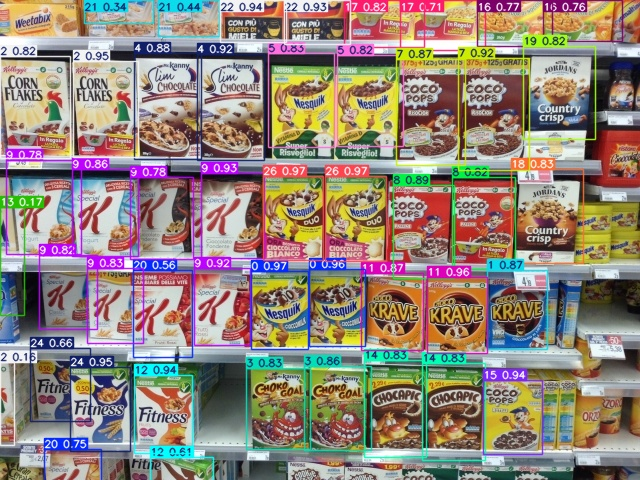

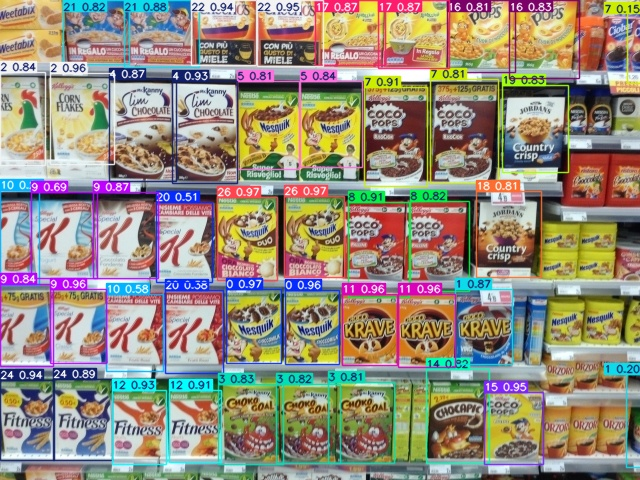

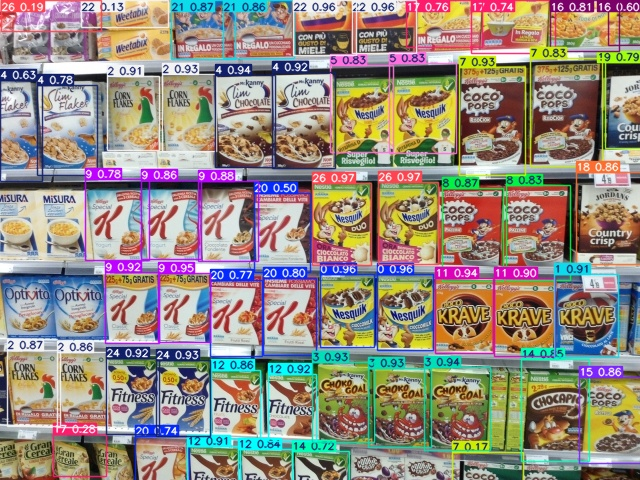

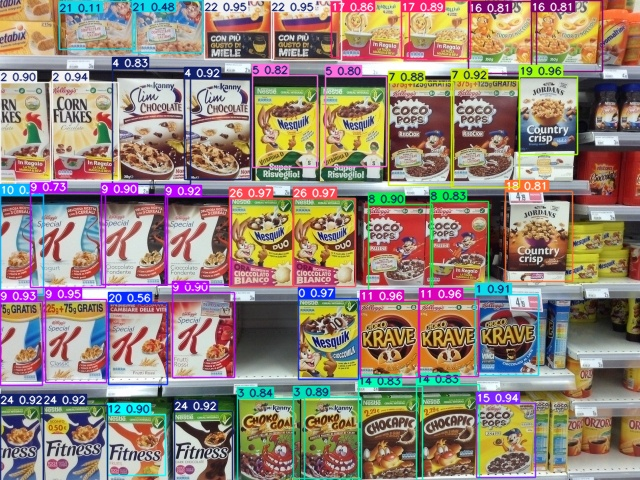

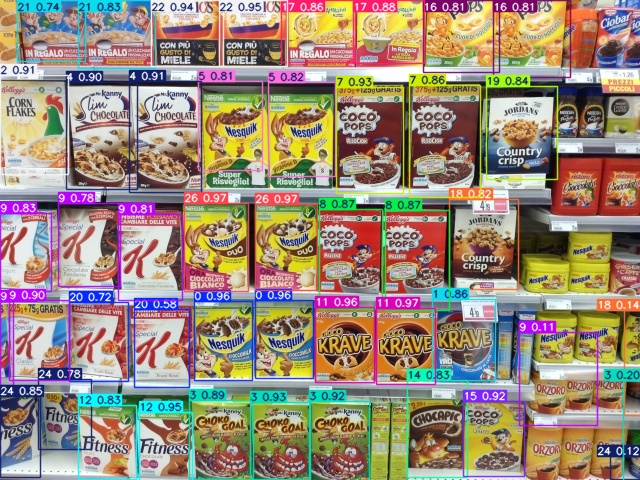

In [14]:
from IPython.display import Image, display
display(Image(filename="runs/detect/stepC_augmented_inference_improved/h1.jpg", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/h2.jpg", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/h3.jpg", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/h4.jpg", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/h5.jpg", width=600, height=600))

#### 8.2.1 Analysis

Across all scenes, YOLOv5 successfully detects most cereal boxes with high confidence.  
The model generalizes well to real conditions despite being trained entirely on synthetic data:

- boxes are consistently detected row by row;
- repeated products are identified reliably;
- confidence scores remain stable across different lighting and viewpoints.

Some challenges remain:

- occasional false positives on price tags or colorful shelf labels,
- reduced confidence on very small or low-resolution boxes,
- a few missed detections in heavily occluded areas.

Overall, these results confirm that the synthetic dataset with sufficient variety, distortions, and randomness enabled YOLOv5 to achieve strong performance even in real supermarket environments, addressing the Step C whole-shelf challenge effectively.

## 9. Applying YOLOv5 to Step A and Step B Scenes
Although YOLOv5 was originally trained to address Task C (detecting all product instances on a full shelf), we wanted to evaluate whether the model could also generalize to the simpler scenes used in Task A (single product recognition) and Task B (multiple products with limited clutter).

The idea was to test the versatility and robustness of the detector:
if a model trained solely on synthetic full-shelf images is able to perform well even on more controlled or zoomed-in scenes, this would confirm that the synthetic dataset was sufficiently diverse and realistic.

To explore this, we ran the trained YOLOv5 model directly on Step A/B images

### 9.1 Step A – YOLOv5 Predictions

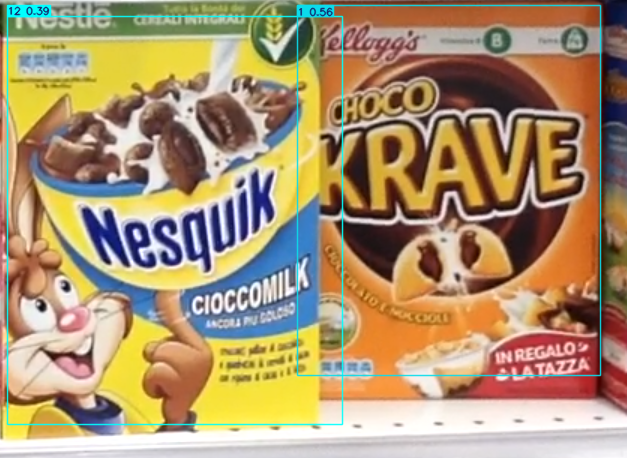

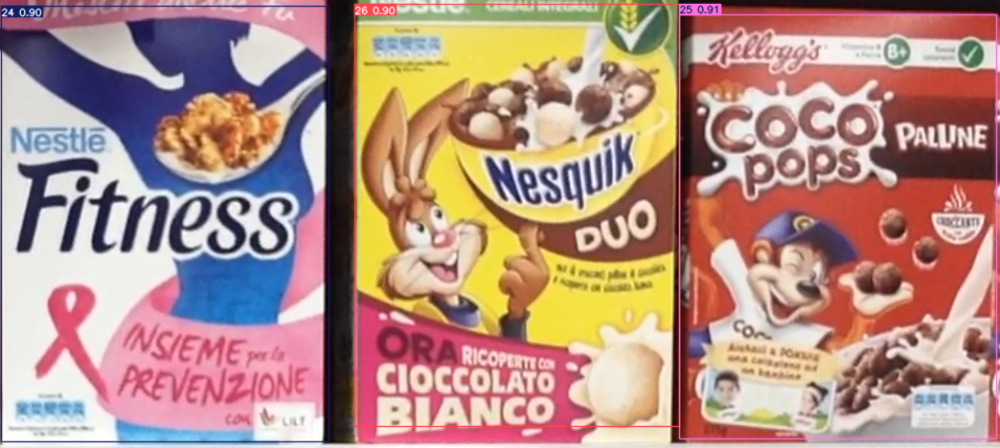

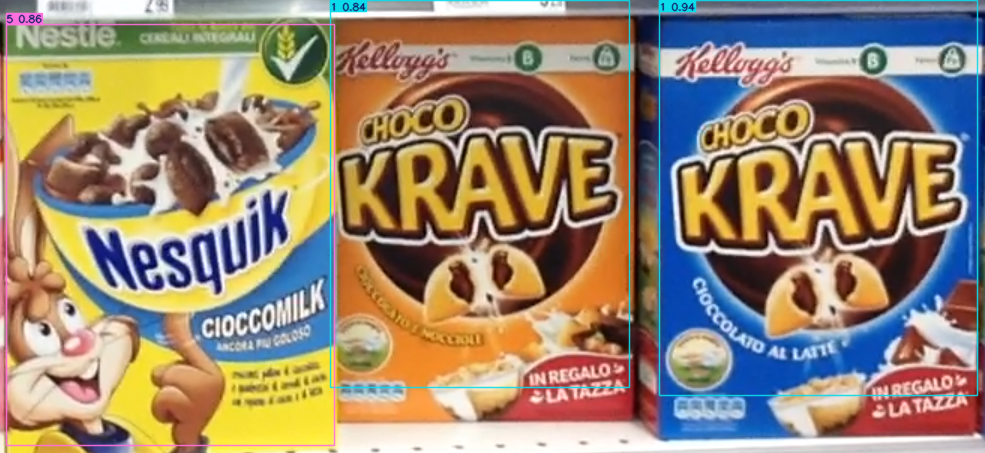

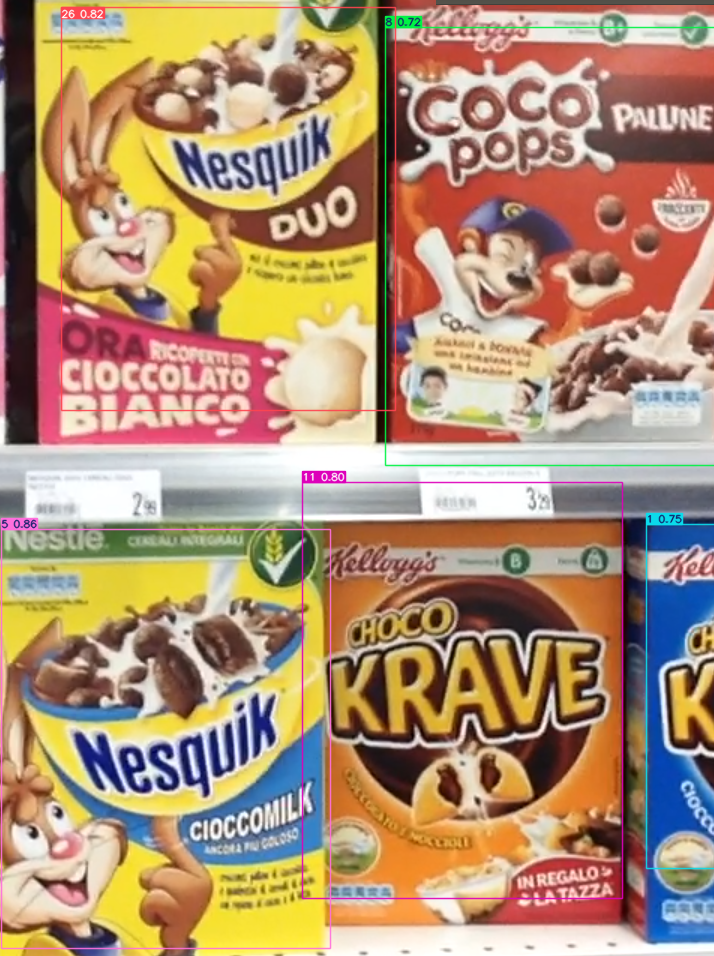

In [15]:
from IPython.display import Image, display
display(Image(filename="runs/detect/stepC_augmented_inference_improved/e1.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/e2.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/e3.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/e4.png", width=600, height=600))

### 9.2 Step B – YOLOv5 Predictions

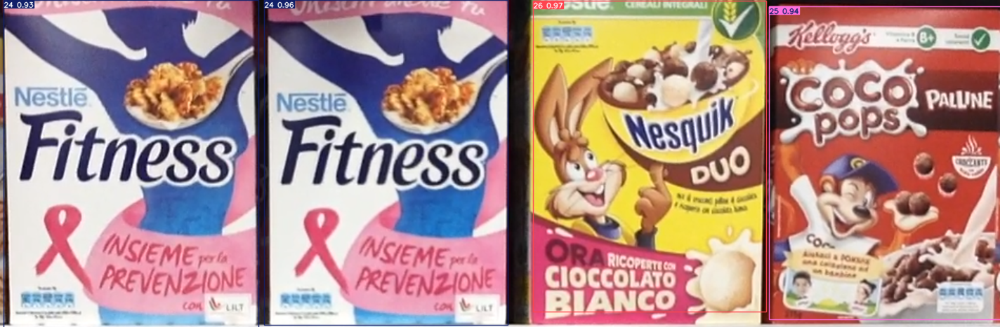

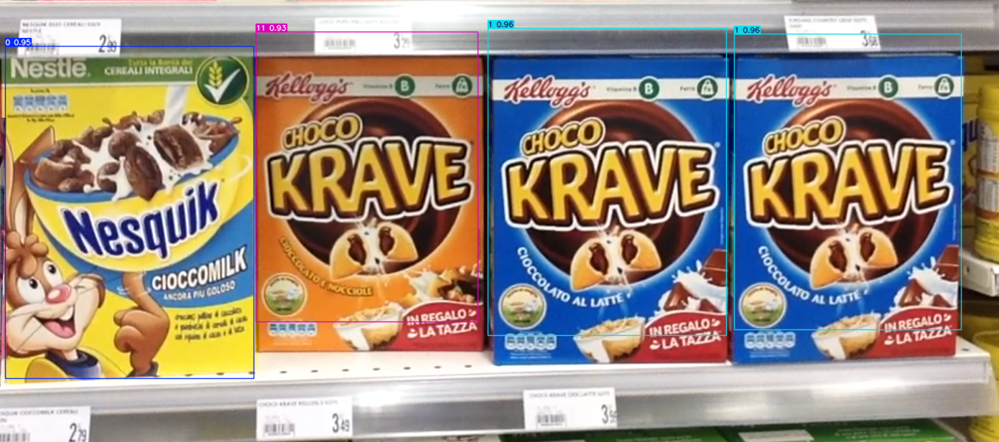

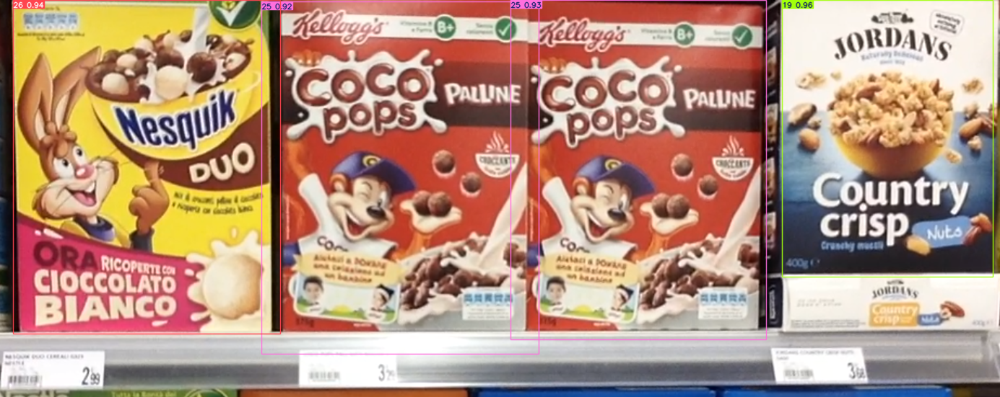

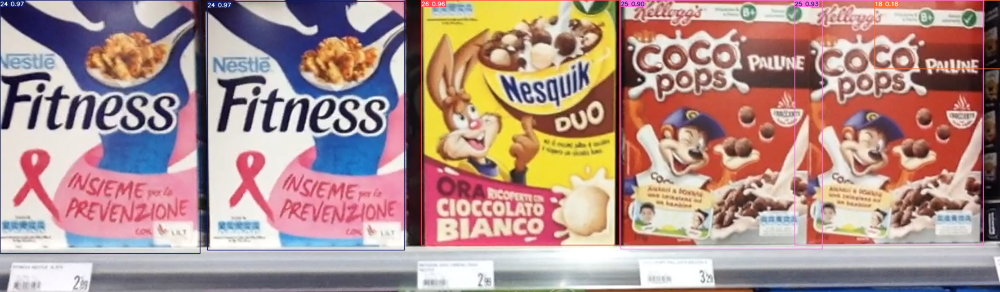

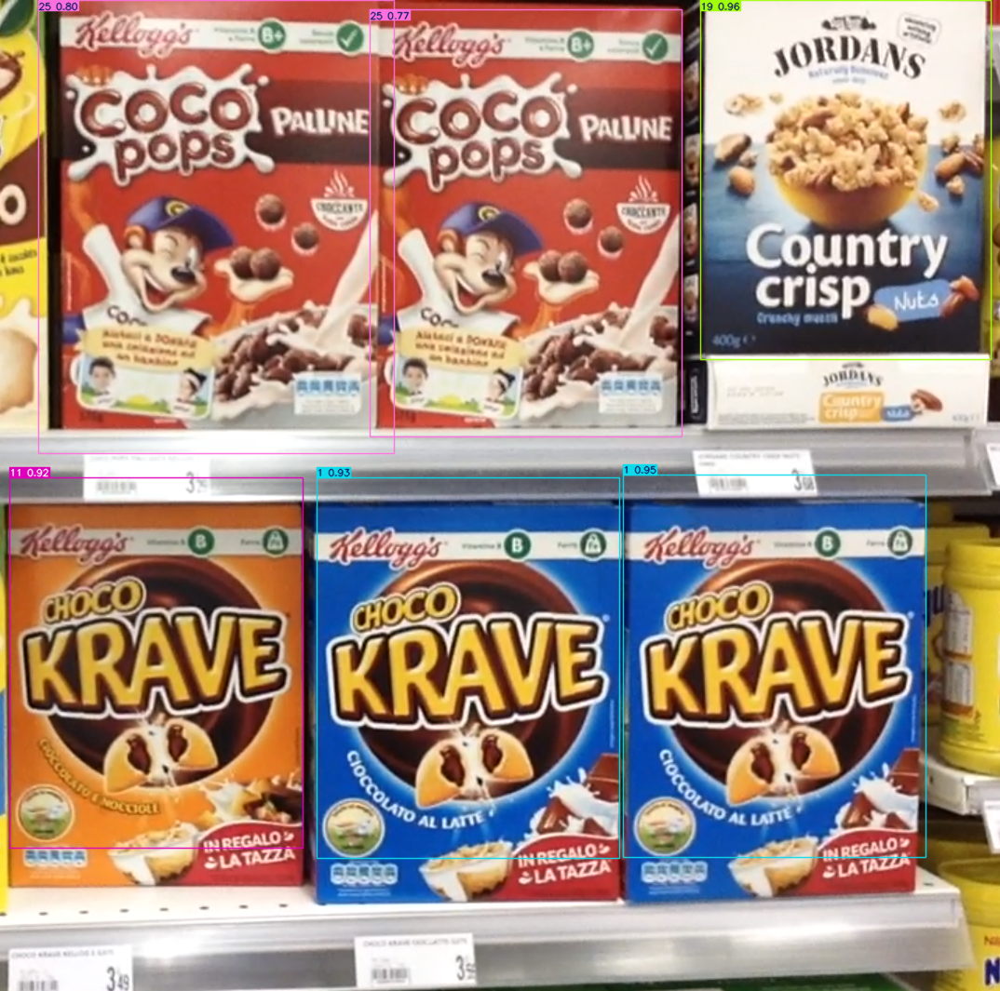

In [16]:
from IPython.display import Image, display
display(Image(filename="runs/detect/stepC_augmented_inference_improved/m1.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/m2.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/m3.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/m4.png", width=600, height=600))
display(Image(filename="runs/detect/stepC_augmented_inference_improved/m5.png", width=600, height=600))

### 9.3 YOLOv5 Performance on Step A and Step B

Despite being trained exclusively on highly cluttered, large-scale synthetic shelves, the model performed *remarkably well* on the real images from **Step A** and **Step B**.  
In both tasks, YOLOv5 was able to:

- detect products accurately even at very close range,  
- maintain consistently high confidence scores,  
- correctly distinguish visually similar cereal packages,  
- remain stable under motion blur, low resolution, or variable lighting conditions.

These results indicate that the synthetic dataset included enough diversity and randomness to let the model generalize across different scales, viewpoints, and photographic conditions.  
Overall, YOLOv5 successfully solved **both Step A and Step B**, confirming the robustness of the synthetic-to-real transfer.


## 10. Conclusion

In this project, we tackled the challenging problem of product detection on supermarket shelves using YOLOv5, despite starting from a scenario with no real annotated dataset.  
Through the design of a **large, diverse, and carefully randomized synthetic dataset**, we enabled the model to learn the visual variability that naturally appears in real shelf environments: occlusions, distortions, lighting variations, clutter, and strong inter-class similarity.

Several key outcomes emerged:

- The synthetic dataset became progressively more effective as we increased its **size, realism, and randomness**.  
- YOLOv5 achieved **excellent performance** on the validation set, with high precision, recall, and mAP.  
- When tested on the real shelf scenes of **Step C**, the model demonstrated strong generalization capabilities, correctly detecting dozens of products per image.  
- Surprisingly, despite being trained only on complex full-shelf scenes, the network also solved **Step A** and **Step B** perfectly, showing robust detection even at close range and under adverse imaging conditions.

Overall, this work demonstrates that—when designed with enough variability—a synthetic dataset can be a powerful substitute for real annotations, enabling reliable object detection models even in challenging, real-world contexts such as supermarket shelves.  
YOLOv5 proved to be a flexible and efficient framework for this task, combining ease of use, high accuracy, and strong generalization.

The project highlights how synthetic data, combined with modern deep learning tools, can greatly reduce annotation cost while still delivering high-quality results.
